In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import ndimage

from keras import models
from keras import layers
from keras.layers import Dropout, Flatten, Dense, GlobalAveragePooling2D, Conv2D, MaxPooling2D
from keras.layers import Dense, Dropout, GlobalAveragePooling2D
from keras import optimizers
from keras_preprocessing.image import ImageDataGenerator
# from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
import keras
from keras.callbacks import ModelCheckpoint
from tensorflow.keras.applications import DenseNet121
from keras.applications.xception import Xception
from keras.applications import VGG16
from keras.applications import NASNetLarge, InceptionV3
from keras.models import Model
from keras.utils.vis_utils import plot_model

from sklearn.preprocessing import LabelBinarizer, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

from keras.preprocessing import image
import os, shutil
from IPython.display import display
import os
import cv2
import math
import json

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt

Using TensorFlow backend.


In [4]:
bread_labels = pd.read_csv('../pet_data/breed_labels.csv')
color_labels = pd.read_csv('../pet_data/color_labels.csv')
state_labels = pd.read_csv('../pet_data/state_labels.csv')
test_sample_submission = pd.read_csv('../pet_data/test/sample_submission.csv')
test_df = pd.read_csv('../pet_data/test/test.csv')
train_df = pd.read_csv('../pet_data/train.csv')
train_folder = '../pet_data/train_images/'
test_folder = '../pet_data/test_images/'

In [5]:
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 6540820771401683760
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 6671596257
locality {
  bus_id: 1
  links {
  }
}
incarnation: 8113469577492902342
physical_device_desc: "device: 0, name: GeForce GTX 1080, pci bus id: 0000:00:03.0, compute capability: 6.1"
]


In [6]:
name_target_dict = train_df.set_index('PetID')['AdoptionSpeed'].to_dict()
name_target_dict_type = train_df.set_index('PetID')['Type'].to_dict()
train_image_names = os.listdir('../pet_data/train_images')
test_image_names = os.listdir('../pet_data/test_images')

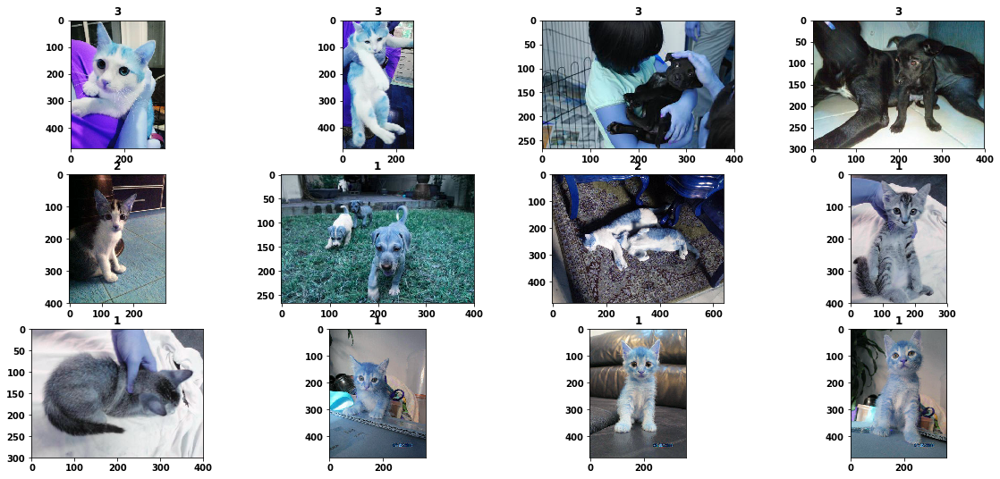

In [7]:
def display_samples(columns=4, rows=3):
    fig=plt.figure(figsize=(5*columns, 3*rows))

    for i in range(columns*rows):
        image_path = train_image_names[i]
        image_id = name_target_dict[image_path.split('-')[0]]
        img = cv2.imread(f'../pet_data/train_images/{image_path}')
        fig.add_subplot(rows, columns, i+1)
        plt.title(image_id)
        plt.imshow(img)

display_samples()

In [8]:
generator_dict = {'filename': [], 'class': [], 'type': []}

for name in train_image_names:
    short_name = name.split('-')[0]
    label = name_target_dict[short_name]
    t = name_target_dict_type[short_name]
    
    generator_dict['filename'].append(name)
    generator_dict['class'].append(label)
    generator_dict['type'].append(str(t))
generator_df = pd.DataFrame(generator_dict)
generator_df.head(8)

,filename,class,type
0,0008c5398-1.jpg,3,2
1,0008c5398-5.jpg,3,2
2,000fb9572-1.jpg,3,1
3,000fb9572-3.jpg,3,1
4,0011d7c25-1.jpg,2,2
5,00156db4a-5.jpg,1,1
6,001a1aaad-1.jpg,2,2
7,001b1507c-2.jpg,1,2


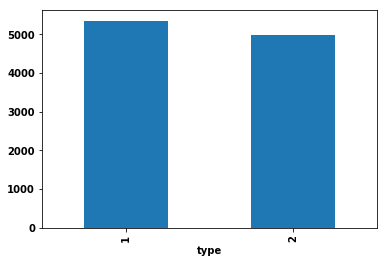

In [9]:
generator_df.groupby('type').size().plot.bar()

In [10]:
import itertools
def plot_confusion_matrix(cm, classes, normalize=False, title='confusion matrix', cmap=plt.cm.Blues):
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[: np.newaxis]
        print('normalized confusion matrix')
    else:
        print('unnormalized confusion matrix')
        
    print(cm)
    
    thresh = cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                horizontalalignment='center',
                color='white' if cm[i, j] > thresh else 'black'
                )
    plt.tight_layout()
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')

In [11]:
import matplotlib.pyplot as plt
%matplotlib inline


def plot_history(history):
    plt.plot(history.history['acc'])
    plt.plot(history.history['val_acc'])
    plt.title('model accuracy')
    plt.ylabel('model accuracy')
    plt.xlabel('accuracy')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.show()

    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('model loss')
    plt.xlabel('loss')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.show()


In [12]:
import matplotlib.image as mpimg
def show_image_predictions(probabilities, direct):
    for index, probability in enumerate(probabilities):
        image_path = direct + "/" +test_generator.filenames[index]
        img = mpimg.imread(image_path)
    #     with open(TEST_FILE,"a") as fh:
    #         fh.write(str(probability[0]) + " for: " + image_path + "\n")
        plt.imshow(img)
        if probability > 0.5:
            plt.title("%.2f" % (probability[0]*100) + "% dog in " + image_path)
        else:
            plt.title("%.2f" % ((1-probability[0])*100) + "% cat")
        plt.show()

In [13]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(generator_df, test_size=0.2)

# Augmentation

In [15]:

train_datagen=ImageDataGenerator(
    featurewise_center=False,  # set input mean to 0 over the dataset
    samplewise_center=False,  # set each sample mean to 0
    featurewise_std_normalization=False,  # divide inputs by std of the dataset
    samplewise_std_normalization=False,  # divide each input by its std
    zca_whitening=False,  # apply ZCA whitening
    zca_epsilon=1e-06,  # epsilon for ZCA whitening
    rotation_range=15,  # randomly rotate images in the range (degrees, 0 to 180)
    width_shift_range=0.1,  # randomly shift images horizontally (fraction of total width)
    height_shift_range=0.1,  # randomly shift images vertically (fraction of total height)
    shear_range=0.1,  # set range for random shear
    zoom_range=0.1,  # set range for random zoom
    channel_shift_range=0.,  # set range for random channel shifts
    # set mode for filling points outside the input boundaries
    fill_mode='nearest',
    cval=0.,  # value used for fill_mode = "constant"
    horizontal_flip=True,  # randomly flip images
    vertical_flip=False,  # randomly flip images
    # set rescaling factor (applied before any other transformation)
    rescale=1/255.,
    # set function that will be applied on each input
    preprocessing_function=None,
    # fraction of images reserved for validation (strictly between 0 and 1)
    validation_split=0.1
)

def create_generator(subset):
    return train_datagen.flow_from_dataframe(
        train, 
        '../pet_data/train_images/', 
        x_col='filename',
        y_col='type', 
        has_ext=True,  # If image extension is given in x_col
        target_size=(150, 150), 
        color_mode='rgb',
        class_mode='binary', 
        batch_size=16, 
        shuffle=True, 
        seed=2018,
        subset=subset
    )

train_generator = create_generator('training')
valid_generator = create_generator('validation')

Found 7438 images belonging to 2 classes.
Found 826 images belonging to 2 classes.


# Adding BatchNormalization

In [17]:
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu',
                        input_shape=(150, 150, 3)))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(512, activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.Dense(1, activation='sigmoid'))
model.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


In [18]:
checkpoint = ModelCheckpoint(
    'model.h5', 
    monitor='val_acc', 
    verbose=0, 
    save_best_only=True, 
    save_weights_only=False,
    mode='auto'
)

STEP_SIZE_TRAIN = train_generator.n//train_generator.batch_size
STEP_SIZE_VALID = valid_generator.n//valid_generator.batch_size


history = model.fit_generator(
    train_generator,
    steps_per_epoch=STEP_SIZE_TRAIN, 
    epochs=100,
    callbacks=[checkpoint],
    validation_data=valid_generator,
#     use_multiprocessing=True,
    validation_steps=STEP_SIZE_VALID,
    verbose=1
)

Instructions for updating:
Use tf.cast instead.
Epoch 1/100
464/464 [==============================] - 93s 200ms/step - loss: 0.8334 - acc: 0.5921 - val_loss: 0.7510 - val_acc: 0.6262
Epoch 2/100
464/464 [==============================] - 90s 193ms/step - loss: 0.7673 - acc: 0.6181 - val_loss: 0.7247 - val_acc: 0.6222
Epoch 3/100
464/464 [==============================] - 90s 193ms/step - loss: 0.6962 - acc: 0.6414 - val_loss: 0.6233 - val_acc: 0.6642
Epoch 4/100
464/464 [==============================] - 90s 193ms/step - loss: 0.6642 - acc: 0.6508 - val_loss: 0.6323 - val_acc: 0.6716
Epoch 5/100
464/464 [==============================] - 90s 193ms/step - loss: 0.6344 - acc: 0.6672 - val_loss: 0.5827 - val_acc: 0.7148
Epoch 6/100
464/464 [==============================] - 90s 194ms/step - loss: 0.6196 - acc: 0.6840 - val_loss: 0.5930 - val_acc: 0.6827
Epoch 7/100
464/464 [==============================] - 90s 194ms/step - loss: 0.5973 - acc: 0.6944 - val_loss: 0.5485 - val_acc: 0.7309-

464/464 [==============================] - 90s 194ms/step - loss: 0.2869 - acc: 0.8777 - val_loss: 0.3232 - val_acc: 0.8642
Epoch 59/100
464/464 [==============================] - 90s 193ms/step - loss: 0.2758 - acc: 0.8827 - val_loss: 0.3244 - val_acc: 0.8679
Epoch 60/100
464/464 [==============================] - 90s 194ms/step - loss: 0.2898 - acc: 0.8752 - val_loss: 0.3526 - val_acc: 0.8531
Epoch 61/100
464/464 [==============================] - 89s 193ms/step - loss: 0.2750 - acc: 0.8844 - val_loss: 0.3207 - val_acc: 0.8679
Epoch 62/100
464/464 [==============================] - 90s 194ms/step - loss: 0.2757 - acc: 0.8814 - val_loss: 0.3760 - val_acc: 0.8259
Epoch 63/100
464/464 [==============================] - 90s 194ms/step - loss: 0.2827 - acc: 0.8775 - val_loss: 0.3462 - val_acc: 0.8543
Epoch 64/100
464/464 [==============================] - 90s 193ms/step - loss: 0.2741 - acc: 0.8801 - val_loss: 0.2904 - val_acc: 0.8802
Epoch 65/100
464/464 [==============================] 

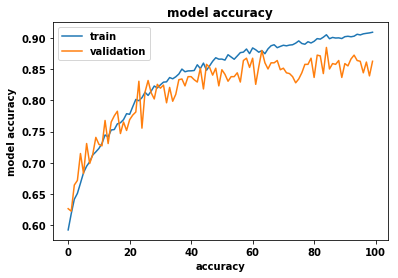

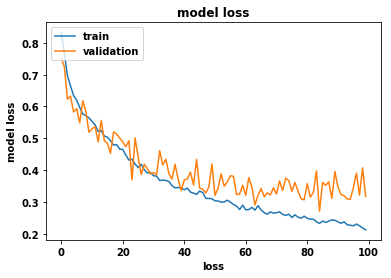

In [19]:
plot_history(history)

In [20]:
# model.load_weights('model.h5')

val_scores = model.evaluate_generator(
    valid_generator,
    STEP_SIZE_VALID,
    verbose=1,
)

print('Validation loss:', val_scores[0])
print('Validation accuracy:', val_scores[1])

51/51 [==============================] - 8s 162ms/step
Validation loss: 0.3536202784673667
Validation accuracy: 0.8395061728395061


In [21]:
test_datagen=ImageDataGenerator(rescale=1./255.)
# cut off the last 3 rows as it messes 
# with the predictions due to the batch size not dividing evenly
test_mod = test[:-3]
test_generator = test_datagen.flow_from_dataframe(
        test_mod, 
        '../pet_data/train_images/', 
        x_col='filename',
        y_col=None, 
        target_size=(150, 150),
        class_mode=None, 
        color_mode='rgb',
        batch_size=16, 
        shuffle=False,
        seed=2018,
    )

STEP_SIZE_TEST = test_generator.n//test_generator.batch_size

Found 2064 images.


In [22]:
test_generator.reset()
pred=model.predict_generator(
    test_generator,
    STEP_SIZE_TEST,
    verbose=1
)

129/129 [==============================] - 9s 68ms/step


In [23]:
prediction_dict = {'filename': [], 'prediction': []}
df = pd.DataFrame()

for index, predict in enumerate(pred):
    filename = test_generator.filenames[index]
    if predict > 0.5:
        prediction_dict['filename'].append(filename) 
        prediction_dict['prediction'].append(2) 
    else: 
        prediction_dict['filename'].append(filename) 
        prediction_dict['prediction'].append(1)

predictions_df = pd.DataFrame(prediction_dict) 

y_true = test_mod.type.astype(int)
y_pred = predictions_df.prediction

In [24]:
confusion_matrix(y_true, y_pred)

array([[926, 110],
       [215, 813]], dtype=int64)

unnormalized confusion matrix
[[926 110]
 [215 813]]


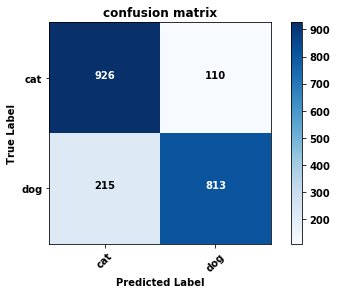

In [25]:
plot_confusion_matrix(
    confusion_matrix(y_true, y_pred),
    ['cat', 'dog']
)

In [26]:
report = classification_report(
    y_true, 
    y_pred, 
    [1, 2]
)
print(report) 

              precision    recall  f1-score   support

           1       0.81      0.89      0.85      1036
           2       0.88      0.79      0.83      1028

   micro avg       0.84      0.84      0.84      2064
   macro avg       0.85      0.84      0.84      2064
weighted avg       0.85      0.84      0.84      2064



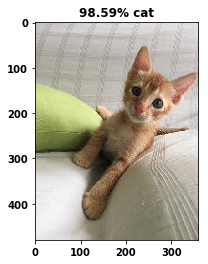

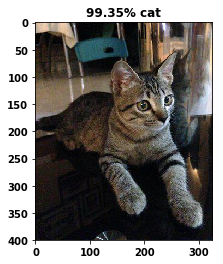

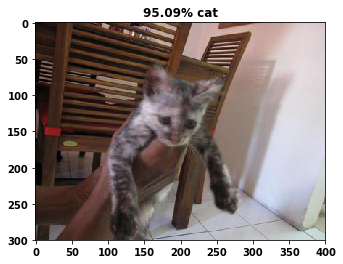

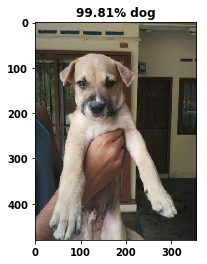

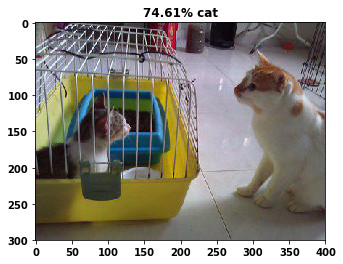

...

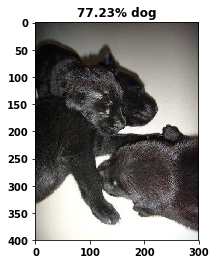

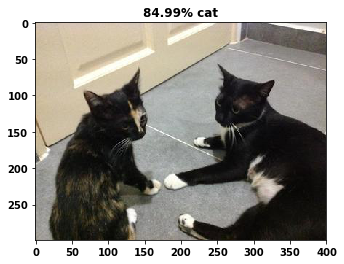

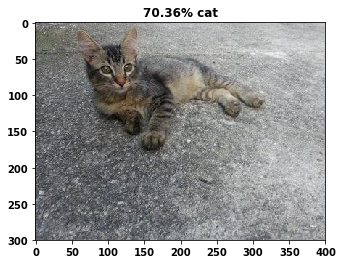

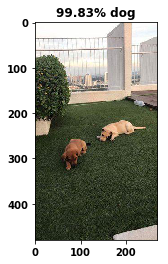

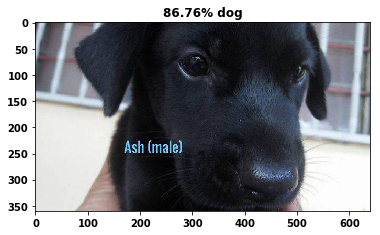

KeyboardInterrupt: 

In [27]:
for index, predict in enumerate(pred):
    image_path = '../pet_data/train_images/' +test_generator.filenames[index]
    img = mpimg.imread(image_path)
    plt.imshow(img)
    if predict > 0.5:
        plt.title("%.2f" % (predict[0]*100) + "% cat")
    else:
        plt.title("%.2f" % ((1-predict[0])*100) + "% dog")
    plt.show()

# DEPTHWISE SEPARABLE CONVOLUTION

In [28]:
model = models.Sequential()
model.add(layers.SeparableConv2D(32, (3, 3), activation='relu',
                        input_shape=(150, 150, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.SeparableConv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.SeparableConv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.SeparableConv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))
model.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])

In [29]:
checkpoint = ModelCheckpoint(
    'model.h5', 
    monitor='val_acc', 
    verbose=0, 
    save_best_only=True, 
    save_weights_only=False,
    mode='auto'
)

STEP_SIZE_TRAIN = train_generator.n//train_generator.batch_size
STEP_SIZE_VALID = valid_generator.n//valid_generator.batch_size


history = model.fit_generator(
    train_generator,
    steps_per_epoch=STEP_SIZE_TRAIN, 
    epochs=100,
    callbacks=[checkpoint],
    validation_data=valid_generator,
#     use_multiprocessing=True,
    validation_steps=STEP_SIZE_VALID,
    verbose=1
)

Epoch 1/100
464/464 [==============================] - 92s 198ms/step - loss: 0.6925 - acc: 0.5220 - val_loss: 0.6942 - val_acc: 0.4840
Epoch 2/100
464/464 [==============================] - 90s 194ms/step - loss: 0.6917 - acc: 0.5258 - val_loss: 0.6970 - val_acc: 0.4889
Epoch 3/100
464/464 [==============================] - 90s 194ms/step - loss: 0.6898 - acc: 0.5301 - val_loss: 0.6907 - val_acc: 0.5074
Epoch 4/100
464/464 [==============================] - 89s 192ms/step - loss: 0.6857 - acc: 0.5544 - val_loss: 0.6856 - val_acc: 0.5741
Epoch 5/100
464/464 [==============================] - 90s 193ms/step - loss: 0.6790 - acc: 0.5717 - val_loss: 0.6831 - val_acc: 0.5679
Epoch 6/100
464/464 [==============================] - 90s 194ms/step - loss: 0.6757 - acc: 0.5819 - val_loss: 0.6802 - val_acc: 0.5674
Epoch 7/100
464/464 [==============================] - 89s 192ms/step - loss: 0.6754 - acc: 0.5798 - val_loss: 0.6787 - val_acc: 0.5741
Epoch 8/100
464/464 [===========================

464/464 [==============================] - 90s 194ms/step - loss: 0.5865 - acc: 0.6928 - val_loss: 0.5848 - val_acc: 0.6926
Epoch 61/100
464/464 [==============================] - 90s 194ms/step - loss: 0.5806 - acc: 0.6881 - val_loss: 0.6145 - val_acc: 0.6654
Epoch 62/100
464/464 [==============================] - 90s 193ms/step - loss: 0.5833 - acc: 0.6919 - val_loss: 0.5793 - val_acc: 0.7062
Epoch 63/100
464/464 [==============================] - 90s 195ms/step - loss: 0.5791 - acc: 0.6974 - val_loss: 0.5957 - val_acc: 0.6975
Epoch 64/100
464/464 [==============================] - 90s 194ms/step - loss: 0.5771 - acc: 0.6976 - val_loss: 0.5773 - val_acc: 0.7136
Epoch 65/100
464/464 [==============================] - 90s 193ms/step - loss: 0.5779 - acc: 0.6966 - val_loss: 0.5759 - val_acc: 0.7111
Epoch 66/100
464/464 [==============================] - 90s 195ms/step - loss: 0.5761 - acc: 0.7010 - val_loss: 0.5883 - val_acc: 0.6901
Epoch 67/100
464/464 [==============================] 

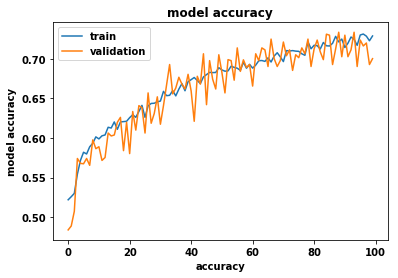

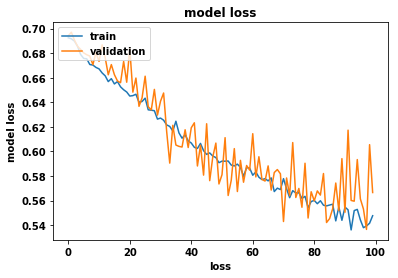

In [33]:
plot_history(history)

In [34]:
# model.load_weights('model.h5')

val_scores = model.evaluate_generator(
    valid_generator,
    STEP_SIZE_VALID,
    verbose=1,
)

print('Validation loss:', val_scores[0])
print('Validation accuracy:', val_scores[1])

51/51 [==============================] - 8s 163ms/step
Validation loss: 0.5396013140678406
Validation accuracy: 0.7222222223693942


In [35]:
test_datagen=ImageDataGenerator(rescale=1./255.)
# cut off the last 3 rows as it messes 
# with the predictions due to the batch size not dividing evenly
test_mod = test[:-3]
test_generator = test_datagen.flow_from_dataframe(
        test_mod, 
        '../pet_data/train_images/', 
        x_col='filename',
        y_col=None, 
        target_size=(150, 150),
        class_mode=None, 
        color_mode='rgb',
        batch_size=16, 
        shuffle=False,
        seed=2018,
    )

STEP_SIZE_TEST = test_generator.n//test_generator.batch_size

Found 2064 images.


In [36]:
test_generator.reset()
pred=model.predict_generator(
    test_generator,
    STEP_SIZE_TEST,
    verbose=1
)

129/129 [==============================] - 9s 70ms/step


In [37]:
prediction_dict = {'filename': [], 'prediction': []}
df = pd.DataFrame()

for index, predict in enumerate(pred):
    filename = test_generator.filenames[index]
    if predict > 0.5:
        prediction_dict['filename'].append(filename) 
        prediction_dict['prediction'].append(2) 
    else: 
        prediction_dict['filename'].append(filename) 
        prediction_dict['prediction'].append(1)

predictions_df = pd.DataFrame(prediction_dict) 

y_true = test_mod.type.astype(int)
y_pred = predictions_df.prediction

unnormalized confusion matrix
[[789 247]
 [299 729]]


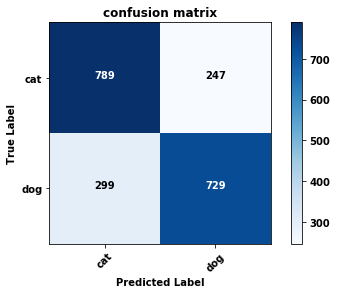

In [38]:
plot_confusion_matrix(
    confusion_matrix(y_true, y_pred),
    ['cat', 'dog']
)

In [39]:
report = classification_report(
    y_true, 
    y_pred, 
    [1, 2]
)
print(report) 

              precision    recall  f1-score   support

           1       0.73      0.76      0.74      1036
           2       0.75      0.71      0.73      1028

   micro avg       0.74      0.74      0.74      2064
   macro avg       0.74      0.74      0.74      2064
weighted avg       0.74      0.74      0.74      2064

